In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import koreanize_matplotlib
from glob import glob
import seaborn as sns

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
files = glob('*.csv')
file_paths = sorted(files)
file_paths

['2021_population.csv',
 'World_Happiness_Report_2015.csv',
 'World_Happiness_Report_2016.csv',
 'World_Happiness_Report_2017.csv',
 'World_Happiness_Report_2018.csv',
 'World_Happiness_Report_2019.csv',
 'World_Happiness_Report_2020.csv',
 'World_Happiness_Report_2021.csv',
 'World_Happiness_Report_2022.csv',
 'happiness_report_19.csv',
 'happiness_report_19to21.csv',
 'happiness_report_20.csv',
 'happiness_report_21.csv',
 'time_series_covid19_confirmed_global.csv']

# 변수의 의미
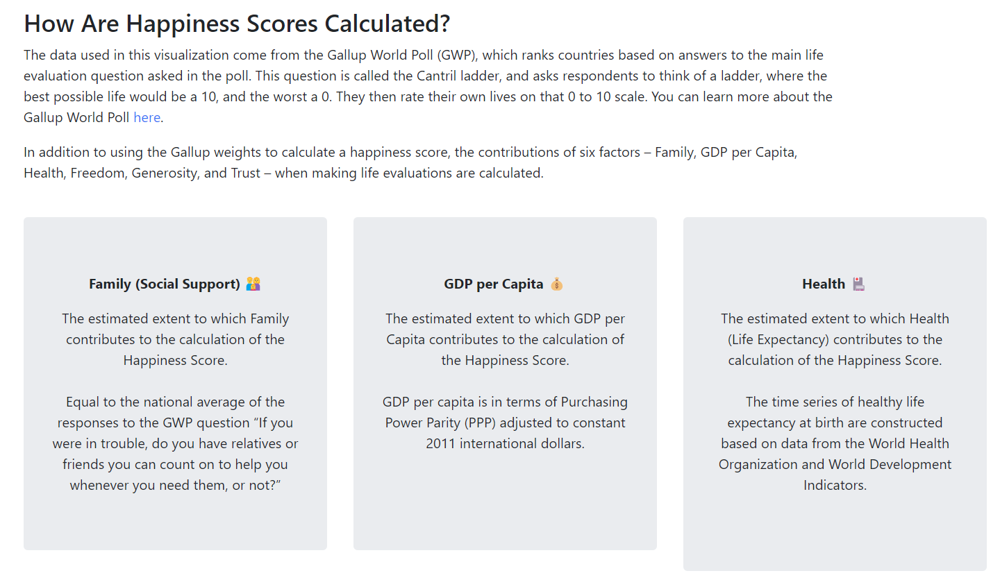
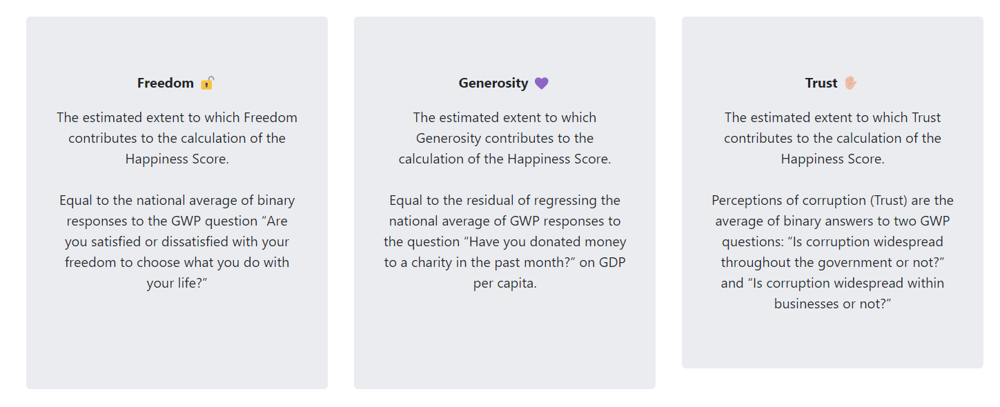
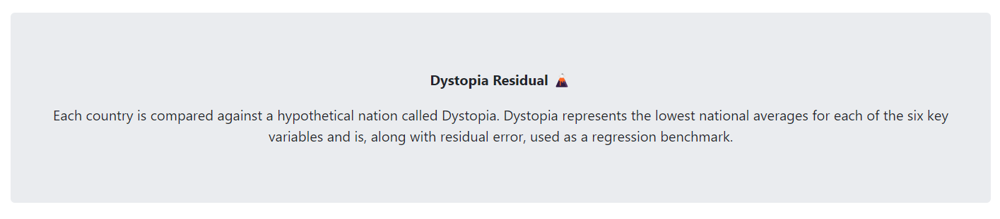
* 3개년의 컬름을 공통적으로 바꿔주면 좋겠다.
* 랭크를 인덱스로 하거나 없애도 괜찮을듯?

## residuals 설명...
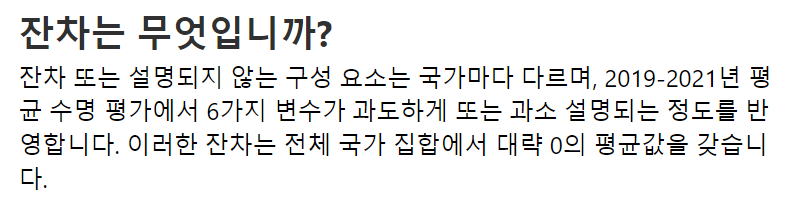
## 잔차와 residuals를 나눠 컬럼을 만드는 것도 괜찮다고 생각했음
참고사이트
* https://worldhappiness.report/ed/2019/changing-world-happiness/
* https://worldhappiness.report/ed/2020/social-environments-for-world-happiness/
* https://worldhappiness.report/faq/

In [3]:
df2019 = pd.read_csv(file_paths[5])
df2020 = pd.read_csv(file_paths[6])
df2021 = pd.read_csv(file_paths[7])

In [4]:
df2019

,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption
0,1,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393
1,2,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410
2,3,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341
3,4,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118
4,5,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298
...,...,...,...,...,...,...,...,...,...
151,152,Rwanda,3.334,0.359,0.711,0.614,0.555,0.217,0.411
152,153,Tanzania,3.231,0.476,0.885,0.499,0.417,0.276,0.147
153,154,Afghanistan,3.203,0.350,0.517,0.361,0.000,0.158,0.025
154,155,Central African Republic,3.083,0.026,0.000,0.105,0.225,0.235,0.035


In [5]:
df2020

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.8087,0.031156,7.869766,7.747634,10.639267,0.954330,71.900825,0.949172,-0.059482,0.195445,1.972317,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835
1,Denmark,Western Europe,7.6456,0.033492,7.711245,7.579955,10.774001,0.955991,72.402504,0.951444,0.066202,0.168489,1.972317,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741
2,Switzerland,Western Europe,7.5599,0.035014,7.628528,7.491272,10.979933,0.942847,74.102448,0.921337,0.105911,0.303728,1.972317,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267
3,Iceland,Western Europe,7.5045,0.059616,7.621347,7.387653,10.772559,0.974670,73.000000,0.948892,0.246944,0.711710,1.972317,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688
4,Norway,Western Europe,7.4880,0.034837,7.556281,7.419719,11.087804,0.952487,73.200783,0.955750,0.134533,0.263218,1.972317,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Central African Republic,Sub-Saharan Africa,3.4759,0.115183,3.701658,3.250141,6.625160,0.319460,45.200001,0.640881,0.082410,0.891807,1.972317,0.041072,0.000000,0.000000,0.292814,0.253513,0.028265,2.860198
149,Rwanda,Sub-Saharan Africa,3.3123,0.052425,3.415053,3.209547,7.600104,0.540835,61.098846,0.900589,0.055484,0.183541,1.972317,0.343243,0.522876,0.572383,0.604088,0.235705,0.485542,0.548445
150,Zimbabwe,Sub-Saharan Africa,3.2992,0.058674,3.414202,3.184198,7.865712,0.763093,55.617260,0.711458,-0.072064,0.810237,1.972317,0.425564,1.047835,0.375038,0.377405,0.151349,0.080929,0.841031
151,South Sudan,Sub-Saharan Africa,2.8166,0.107610,3.027516,2.605684,7.425360,0.553707,51.000000,0.451314,0.016519,0.763417,1.972317,0.289083,0.553279,0.208809,0.065609,0.209935,0.111157,1.378751


In [6]:
df2021

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.000,0.949,-0.098,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.700,0.946,0.030,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.400,0.919,0.025,0.292,2.43,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.000,0.955,0.160,0.673,2.43,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.400,0.913,0.175,0.338,2.43,1.501,1.079,0.753,0.647,0.302,0.384,2.798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,Lesotho,Sub-Saharan Africa,3.512,0.120,3.748,3.276,7.926,0.787,48.700,0.715,-0.131,0.915,2.43,0.451,0.731,0.007,0.405,0.103,0.015,1.800
145,Botswana,Sub-Saharan Africa,3.467,0.074,3.611,3.322,9.782,0.784,59.269,0.824,-0.246,0.801,2.43,1.099,0.724,0.340,0.539,0.027,0.088,0.648
146,Rwanda,Sub-Saharan Africa,3.415,0.068,3.548,3.282,7.676,0.552,61.400,0.897,0.061,0.167,2.43,0.364,0.202,0.407,0.627,0.227,0.493,1.095
147,Zimbabwe,Sub-Saharan Africa,3.145,0.058,3.259,3.030,7.943,0.750,56.201,0.677,-0.047,0.821,2.43,0.457,0.649,0.243,0.359,0.157,0.075,1.205


In [7]:
# 일단 나라 이름을 통합하자!!!

In [8]:
set(df2019['Country or region']) - set(df2020['Country name'])

{'Bhutan',
 'Hong Kong',
 'North Macedonia',
 'Northern Cyprus',
 'Qatar',
 'Somalia',
 'Syria',
 'Taiwan',
 'Trinidad & Tobago'}

In [9]:
set(df2020['Country name']) - set(df2019['Country or region'])

{'Hong Kong S.A.R. of China',
 'Macedonia',
 'Maldives',
 'North Cyprus',
 'Taiwan Province of China',
 'Trinidad and Tobago'}

In [10]:
set(df2020['Country name']) - set(df2021['Country name'])

{'Central African Republic',
 'Congo (Kinshasa)',
 'Macedonia',
 'South Sudan',
 'Trinidad and Tobago'}

In [11]:
set(df2021['Country name']) - set(df2020['Country name'])

{'North Macedonia'}

In [12]:
set(df2019['Country or region']) - set(df2021['Country name'])

{'Bhutan',
 'Central African Republic',
 'Congo (Kinshasa)',
 'Hong Kong',
 'Northern Cyprus',
 'Qatar',
 'Somalia',
 'South Sudan',
 'Syria',
 'Taiwan',
 'Trinidad & Tobago'}

In [13]:
set(df2021['Country name']) - set(df2019['Country or region'])

{'Hong Kong S.A.R. of China',
 'Maldives',
 'North Cyprus',
 'Taiwan Province of China'}

## 헷갈리는 이름 인터넷 서핑을 찾아서 정해보기

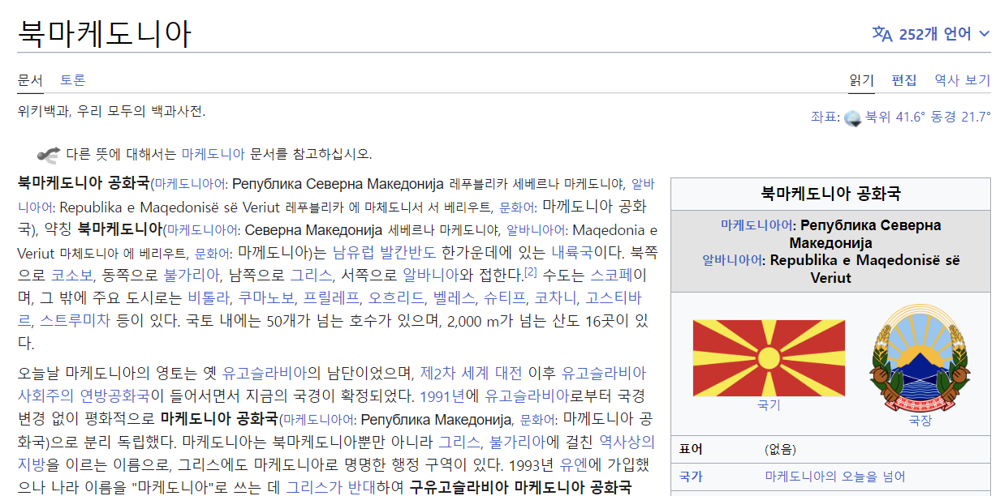
출처 : https://ko.wikipedia.org/wiki/%EB%B6%81%EB%A7%88%EC%BC%80%EB%8F%84%EB%8B%88%EC%95%84

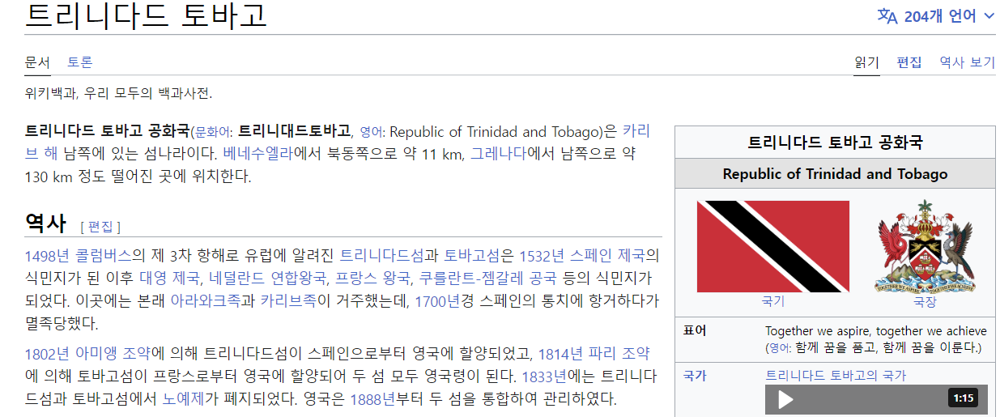
출처 : https://ko.wikipedia.org/wiki/%ED%8A%B8%EB%A6%AC%EB%8B%88%EB%8B%A4%EB%93%9C_%ED%86%A0%EB%B0%94%EA%B3%A0

In [14]:
# 일단 2019년도와 2020년도 나라명 통합
# 헷갈리는 거는 인터넷 서핑 참조
# Hong Kong, Hong Kong S.A.R. of China => Hong Kong
# North Macedonia, Macedonia => North Macedonia
# Northern Cyprus, North Cyprus => North Cyprus
# Taiwan, Taiwan Province of China => Taiwan
# Trinidad & Tobago, Trinidad and Tobago => Trinidad and Tobago
df2020.loc[df2020['Country name'] == 'Hong Kong S.A.R. of China', 'Country name'] = 'Hong Kong'
df2021.loc[df2021['Country name'] == 'Hong Kong S.A.R. of China', 'Country name'] = 'Hong Kong'
df2020.loc[df2020['Country name'] == 'Macedonia', 'Country name'] = 'North Macedonia'
df2020.loc[df2020['Country name'] == 'Macedonia', 'Country name'] = 'North Macedonia'
df2019.loc[df2019['Country or region'] == 'Northern Cyprus', 'Country or region'] = 'North Cyprus'
df2020.loc[df2020['Country name'] == 'Taiwan Province of China', 'Country name'] = 'Taiwan'
df2021.loc[df2021['Country name'] == 'Taiwan Province of China', 'Country name'] = 'Taiwan'
df2019.loc[df2019['Country or region'] == 'Trinidad & Tobago', 'Country or region'] = 'Trinidad and Tobago'

In [15]:
# 나라 이름 깨끗해졌는지 확인!

In [16]:
set(df2019['Country or region']) - set(df2020['Country name'])

{'Bhutan', 'Qatar', 'Somalia', 'Syria'}

In [17]:
set(df2020['Country name']) - set(df2019['Country or region'])

{'Maldives'}

In [18]:
set(df2020['Country name']) - set(df2021['Country name'])

{'Central African Republic',
 'Congo (Kinshasa)',
 'South Sudan',
 'Trinidad and Tobago'}

In [19]:
# 2020년이 2021년 완전히 포함
set(df2021['Country name']) - set(df2020['Country name'])

set()

In [20]:
set(df2019['Country or region']) - set(df2021['Country name'])

{'Bhutan',
 'Central African Republic',
 'Congo (Kinshasa)',
 'Qatar',
 'Somalia',
 'South Sudan',
 'Syria',
 'Trinidad and Tobago'}

In [21]:
set(df2021['Country name']) - set(df2019['Country or region'])

{'Maldives'}

In [22]:
# 모든 차집합이 안겹친다!!!!!

# 2019년 디스토피아 래더점수는 1.88
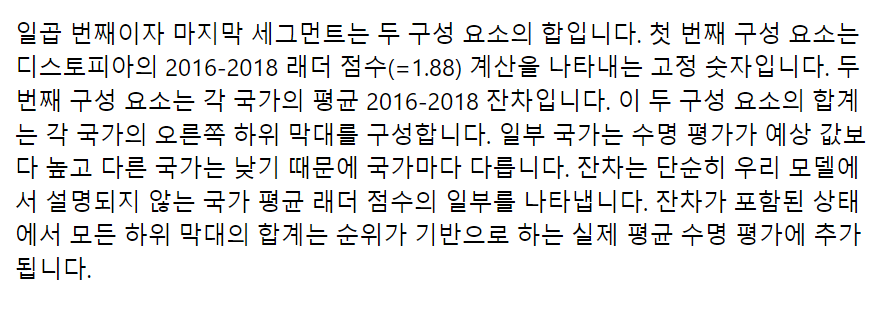

In [23]:
# Overall rank 컬럼 삭제
df2019 = df2019.drop('Overall rank', axis=1)
# Dystopia 컬럼 생성
df2019['Dystopia'] = 1.88
# Dystopia & residual 컬럼 생성!
df2019['Residuals'] = (
                      df2019['Score']
                      -df2019['GDP per capita']
                      -df2019['Social support']
                      -df2019['Healthy life expectancy']
                      -df2019['Freedom to make life choices']
                      -df2019['Generosity']
                      -df2019['Perceptions of corruption']
                      -df2019['Dystopia']
                      )

# Country or region 컬럼이름 Country로 변경
df2019 = df2019.rename(columns = {'Country or region':'Country'})
df2019

,Country,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals
0,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393,1.88,0.834
1,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410,1.88,0.514
2,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341,1.88,0.361
3,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118,1.88,0.521
4,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298,1.88,0.514
...,...,...,...,...,...,...,...,...,...,...
151,Rwanda,3.334,0.359,0.711,0.614,0.555,0.217,0.411,1.88,-1.413
152,Tanzania,3.231,0.476,0.885,0.499,0.417,0.276,0.147,1.88,-1.349
153,Afghanistan,3.203,0.350,0.517,0.361,0.000,0.158,0.025,1.88,-0.088
154,Central African Republic,3.083,0.026,0.000,0.105,0.225,0.235,0.035,1.88,0.577


In [24]:
df2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156 entries, 0 to 155
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       156 non-null    object 
 1   Score                         156 non-null    float64
 2   GDP per capita                156 non-null    float64
 3   Social support                156 non-null    float64
 4   Healthy life expectancy       156 non-null    float64
 5   Freedom to make life choices  156 non-null    float64
 6   Generosity                    156 non-null    float64
 7   Perceptions of corruption     156 non-null    float64
 8   Dystopia                      156 non-null    float64
 9   Residuals                     156 non-null    float64
dtypes: float64(9), object(1)
memory usage: 12.3+ KB


In [25]:
df2020_country_region = df2020.iloc[:, 0:2]
df2020_country_region

,Country name,Regional indicator
0,Finland,Western Europe
1,Denmark,Western Europe
2,Switzerland,Western Europe
3,Iceland,Western Europe
4,Norway,Western Europe
...,...,...
148,Central African Republic,Sub-Saharan Africa
149,Rwanda,Sub-Saharan Africa
150,Zimbabwe,Sub-Saharan Africa
151,South Sudan,Sub-Saharan Africa


In [26]:
# 머지를 통해 지역 찾기
df2019 = df2019.merge(df2020_country_region,
                      how='left',
                      left_on="Country",
                      right_on='Country name')
# 필요 컬럼만 추출
df2019 = df2019[[
                'Country',
                'Regional indicator', 
                'Score',
                'GDP per capita', 
                'Social support',
                'Healthy life expectancy',
                'Freedom to make life choices',
                'Generosity',
                'Perceptions of corruption',
                'Dystopia',
                'Residuals'
                ]]
# Regional indicator 컬럼 Region으로 컬럼명 변경
df2019 = df2019.rename(columns={'Regional indicator':'Region'})
df2019

,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals
0,Finland,Western Europe,7.769,1.340,1.587,0.986,0.596,0.153,0.393,1.88,0.834
1,Denmark,Western Europe,7.600,1.383,1.573,0.996,0.592,0.252,0.410,1.88,0.514
2,Norway,Western Europe,7.554,1.488,1.582,1.028,0.603,0.271,0.341,1.88,0.361
3,Iceland,Western Europe,7.494,1.380,1.624,1.026,0.591,0.354,0.118,1.88,0.521
4,Netherlands,Western Europe,7.488,1.396,1.522,0.999,0.557,0.322,0.298,1.88,0.514
...,...,...,...,...,...,...,...,...,...,...,...
151,Rwanda,Sub-Saharan Africa,3.334,0.359,0.711,0.614,0.555,0.217,0.411,1.88,-1.413
152,Tanzania,Sub-Saharan Africa,3.231,0.476,0.885,0.499,0.417,0.276,0.147,1.88,-1.349
153,Afghanistan,South Asia,3.203,0.350,0.517,0.361,0.000,0.158,0.025,1.88,-0.088
154,Central African Republic,Sub-Saharan Africa,3.083,0.026,0.000,0.105,0.225,0.235,0.035,1.88,0.577


In [27]:
df2019['Region'].value_counts()

Sub-Saharan Africa                    39
Western Europe                        21
Latin America and Caribbean           21
Middle East and North Africa          17
Central and Eastern Europe            17
Commonwealth of Independent States    12
Southeast Asia                         9
East Asia                              6
South Asia                             6
North America and ANZ                  4
Name: Region, dtype: int64

In [28]:
# 이 4개는 지역 찾아서 넣어주면 될듯?
df2019[df2019['Region'].isna()]

,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals
28,Qatar,NaN,6.374,1.684,1.313,0.871,0.555,0.220,0.167,1.88,-0.316
94,Bhutan,NaN,5.082,0.813,1.321,0.604,0.457,0.370,0.167,1.88,-0.530
111,Somalia,NaN,4.668,0.000,0.698,0.268,0.559,0.243,0.270,1.88,0.750
148,Syria,NaN,3.462,0.619,0.378,0.440,0.013,0.331,0.141,1.88,-0.340


In [29]:
# 카타르는 중동이니 Middle East and North Africa에 넣어주자
df2019.loc[df2019['Country'] == 'Qatar', 'Region'] = 'Middle East and North Africa'
# 부탄은 남아시아에 속한다!
df2019.loc[df2019['Country'] == 'Bhutan', 'Region'] = 'South Asia'
# 소말리아 사하라이남 아프리카에 속한다!
df2019.loc[df2019['Country'] == 'Somalia', 'Region'] = 'Sub-Saharan Africa'
# 시리아는 중동
df2019.loc[df2019['Country'] == 'Syria', 'Region'] = 'Middle East and North Africa'

In [30]:
# Region 결측치 해결!
df2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 156 entries, 0 to 155
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       156 non-null    object 
 1   Region                        156 non-null    object 
 2   Score                         156 non-null    float64
 3   GDP per capita                156 non-null    float64
 4   Social support                156 non-null    float64
 5   Healthy life expectancy       156 non-null    float64
 6   Freedom to make life choices  156 non-null    float64
 7   Generosity                    156 non-null    float64
 8   Perceptions of corruption     156 non-null    float64
 9   Dystopia                      156 non-null    float64
 10  Residuals                     156 non-null    float64
dtypes: float64(9), object(2)
memory usage: 14.6+ KB


In [31]:
# 마지막으로 year컬럼을 생성해주자!
# 구체적인 날짜가 아니라 그냥 데이터타입은 오브젝트로 함!
df2019['Year'] = '2019'

# 컬럼 순서 정리
df2019 = df2019[['Year',
                 'Country',
                 'Region',
                 'Score',
                 'GDP per capita',
                 'Social support',
                 'Healthy life expectancy',
                 'Freedom to make life choices',
                 'Generosity',
                 'Perceptions of corruption',
                 'Dystopia',
                 'Residuals'
                 ]]
df2019

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals
0,2019,Finland,Western Europe,7.769,1.340,1.587,0.986,0.596,0.153,0.393,1.88,0.834
1,2019,Denmark,Western Europe,7.600,1.383,1.573,0.996,0.592,0.252,0.410,1.88,0.514
2,2019,Norway,Western Europe,7.554,1.488,1.582,1.028,0.603,0.271,0.341,1.88,0.361
3,2019,Iceland,Western Europe,7.494,1.380,1.624,1.026,0.591,0.354,0.118,1.88,0.521
4,2019,Netherlands,Western Europe,7.488,1.396,1.522,0.999,0.557,0.322,0.298,1.88,0.514
...,...,...,...,...,...,...,...,...,...,...,...,...
151,2019,Rwanda,Sub-Saharan Africa,3.334,0.359,0.711,0.614,0.555,0.217,0.411,1.88,-1.413
152,2019,Tanzania,Sub-Saharan Africa,3.231,0.476,0.885,0.499,0.417,0.276,0.147,1.88,-1.349
153,2019,Afghanistan,South Asia,3.203,0.350,0.517,0.361,0.000,0.158,0.025,1.88,-0.088
154,2019,Central African Republic,Sub-Saharan Africa,3.083,0.026,0.000,0.105,0.225,0.235,0.035,1.88,0.577


In [32]:
# Residuals컬럼 생성
df2020['Residuals'] = df2020['Dystopia + residual'] - df2020['Ladder score in Dystopia']
df2020 = df2020.iloc[:, [0, 1, 2, 12, 13, 14, 15, 16, 17, 18, 20]]
cols = ['Country',
        'Region', 
        'Score',
        'Dystopia',
        'GDP per capita', 
        'Social support',
        'Healthy life expectancy',
        'Freedom to make life choices',
        'Generosity',
        'Perceptions of corruption',
        'Residuals'
        ]
# 컬럼명 변경
df2020.columns = cols

# 수치 데이터 소수점 3자리까지 반올림(디스토피아는 이미 2자리)
df2020 = df2020.round(3)

# 디스토피아는 소수점 2자리까지 반올림
df2020['Dystopia'] = df2020['Dystopia'].round(2)

# 중복값 제거
df2020 = df2020.drop_duplicates()

In [33]:
df2020

,Country,Region,Score,Dystopia,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Residuals
0,Finland,Western Europe,7.809,1.97,1.285,1.500,0.961,0.662,0.160,0.478,0.791
1,Denmark,Western Europe,7.646,1.97,1.327,1.503,0.979,0.665,0.243,0.495,0.460
2,Switzerland,Western Europe,7.560,1.97,1.391,1.472,1.041,0.629,0.269,0.408,0.378
3,Iceland,Western Europe,7.504,1.97,1.327,1.548,1.001,0.662,0.362,0.145,0.488
4,Norway,Western Europe,7.488,1.97,1.424,1.495,1.008,0.670,0.288,0.434,0.196
...,...,...,...,...,...,...,...,...,...,...,...
148,Central African Republic,Sub-Saharan Africa,3.476,1.97,0.041,0.000,0.000,0.293,0.254,0.028,0.888
149,Rwanda,Sub-Saharan Africa,3.312,1.97,0.343,0.523,0.572,0.604,0.236,0.486,-1.424
150,Zimbabwe,Sub-Saharan Africa,3.299,1.97,0.426,1.048,0.375,0.377,0.151,0.081,-1.131
151,South Sudan,Sub-Saharan Africa,2.817,1.97,0.289,0.553,0.209,0.066,0.210,0.111,-0.594


In [34]:
# 마지막으로 year컬럼을 생성해주자!
df2020['Year'] = '2020'

# 컬럼 순서 정리
df2020 = df2020[['Year',
                 'Country',
                 'Region',
                 'Score',
                 'GDP per capita',
                 'Social support',
                 'Healthy life expectancy',
                 'Freedom to make life choices',
                 'Generosity',
                 'Perceptions of corruption',
                 'Dystopia',
                 'Residuals'
                 ]]
df2020

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals
0,2020,Finland,Western Europe,7.809,1.285,1.500,0.961,0.662,0.160,0.478,1.97,0.791
1,2020,Denmark,Western Europe,7.646,1.327,1.503,0.979,0.665,0.243,0.495,1.97,0.460
2,2020,Switzerland,Western Europe,7.560,1.391,1.472,1.041,0.629,0.269,0.408,1.97,0.378
3,2020,Iceland,Western Europe,7.504,1.327,1.548,1.001,0.662,0.362,0.145,1.97,0.488
4,2020,Norway,Western Europe,7.488,1.424,1.495,1.008,0.670,0.288,0.434,1.97,0.196
...,...,...,...,...,...,...,...,...,...,...,...,...
148,2020,Central African Republic,Sub-Saharan Africa,3.476,0.041,0.000,0.000,0.293,0.254,0.028,1.97,0.888
149,2020,Rwanda,Sub-Saharan Africa,3.312,0.343,0.523,0.572,0.604,0.236,0.486,1.97,-1.424
150,2020,Zimbabwe,Sub-Saharan Africa,3.299,0.426,1.048,0.375,0.377,0.151,0.081,1.97,-1.131
151,2020,South Sudan,Sub-Saharan Africa,2.817,0.289,0.553,0.209,0.066,0.210,0.111,1.97,-0.594


In [35]:
# Residuals컬럼 생성
df2021['Residuals'] = df2021['Dystopia + residual'] - df2021['Ladder score in Dystopia']
df2021 = df2021.iloc[:, [0, 1, 2, 12, 13, 14, 15, 16, 17, 18, 20]]
cols = ['Country',
        'Region', 
        'Score',
        'Dystopia',
        'GDP per capita', 
        'Social support',
        'Healthy life expectancy',
        'Freedom to make life choices',
        'Generosity',
        'Perceptions of corruption',
        'Residuals'
        ]
# 컬럼명 변경
df2021.columns = cols

# 수치 데이터 소수점 3자리까지 반올림(디스토피아는 이미 2자리)
df2021 = df2021.round(3)

# 중복값 제거
df2021 = df2021.drop_duplicates()

In [36]:
# 마지막으로 year컬럼을 생성해주자!
df2021['Year'] = '2021'

# 컬럼 순서 정리
df2021 = df2021[['Year',
                 'Country',
                 'Region',
                 'Score',
                 'GDP per capita',
                 'Social support',
                 'Healthy life expectancy',
                 'Freedom to make life choices',
                 'Generosity',
                 'Perceptions of corruption',
                 'Dystopia',
                 'Residuals'
                 ]]
df2021

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals
0,2021,Finland,Western Europe,7.842,1.446,1.106,0.741,0.691,0.124,0.481,2.43,0.823
1,2021,Denmark,Western Europe,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.43,0.438
2,2021,Switzerland,Western Europe,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.43,0.409
3,2021,Iceland,Western Europe,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.43,0.537
4,2021,Netherlands,Western Europe,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.43,0.368
...,...,...,...,...,...,...,...,...,...,...,...,...
144,2021,Lesotho,Sub-Saharan Africa,3.512,0.451,0.731,0.007,0.405,0.103,0.015,2.43,-0.630
145,2021,Botswana,Sub-Saharan Africa,3.467,1.099,0.724,0.340,0.539,0.027,0.088,2.43,-1.782
146,2021,Rwanda,Sub-Saharan Africa,3.415,0.364,0.202,0.407,0.627,0.227,0.493,2.43,-1.335
147,2021,Zimbabwe,Sub-Saharan Africa,3.145,0.457,0.649,0.243,0.359,0.157,0.075,2.43,-1.225


In [37]:
# 코로나 데이터 얻기! 2021년 행복지수는 2020년도의 수치가 반영된 것!
# 2020년 코로나 데이터를 2021년에 적용시켜보자!

In [38]:
corona_confirmed = pd.read_csv('time_series_covid19_confirmed_global.csv')

In [39]:
# 코로나 확진자 일별 데이터(누적)
corona_confirmed

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/9/22,9/10/22,9/11/22,9/12/22,9/13/22,9/14/22,9/15/22,9/16/22,9/17/22,9/18/22
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,195471,195631,195925,196182,196404,196751,196870,196992,197066,197240
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,330842,330948,331036,331053,331191,331295,331384,331459,331540,331583
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,270522,270532,270539,270551,270551,270570,270584,270599,270606,270609
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,46113,46113,46113,46113,46113,46147,46147,46147,46147,46147
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,103131,103131,103131,103131,103131,103131,103131,103131,103131,103131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,702591,702591,702591,702591,702591,702591,702768,702768,702768,702768
285,NaN,Winter Olympics 2022,39.904200,116.407400,0,0,0,0,0,0,...,535,535,535,535,535,535,535,535,535,535
286,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,11932,11932,11932,11932,11932,11932,11932,11932,11932,11932
287,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,333204,333220,333229,333234,333274,333313,333337,333363,333375,333382


In [40]:
corona_confirmed_country = corona_confirmed['Country/Region']
corona_confirmed_country

0               Afghanistan
1                   Albania
2                   Algeria
3                   Andorra
4                    Angola
               ...         
284      West Bank and Gaza
285    Winter Olympics 2022
286                   Yemen
287                  Zambia
288                Zimbabwe
Name: Country/Region, Length: 289, dtype: object

In [41]:
# 2020년 코로나 확진자수
corona_confirmed_count = corona_confirmed.loc[:, '12/31/20']
corona_confirmed_count

0       52330
1       58316
2       99610
3        8049
4       17553
        ...  
284    138004
285         0
286      2099
287     20725
288     13867
Name: 12/31/20, Length: 289, dtype: int64

In [42]:
# 2020년 코로나 Country/Region별 확진자수
corona_confirmed_2020 = pd.concat([corona_confirmed_country,
                                   corona_confirmed_count
                                  ], axis=1)
corona_confirmed_2020 = corona_confirmed_2020.rename(columns={'12/31/20':'confirmed_num'})
corona_confirmed_2020

,Country/Region,confirmed_num
0,Afghanistan,52330
1,Albania,58316
2,Algeria,99610
3,Andorra,8049
4,Angola,17553
...,...,...
284,West Bank and Gaza,138004
285,Winter Olympics 2022,0
286,Yemen,2099
287,Zambia,20725


In [43]:
# 이제 여러개로 분리된 나라를 합쳐야한다...
pd.set_option('display.max_rows', None)
corona_confirmed_2020['Country/Region'].value_counts()

China                               34
Canada                              16
United Kingdom                      15
France                              12
Australia                            8
Netherlands                          5
Denmark                              3
New Zealand                          3
Panama                               1
Niger                                1
Nigeria                              1
North Macedonia                      1
Norway                               1
Oman                                 1
Pakistan                             1
Palau                                1
Peru                                 1
Papua New Guinea                     1
Paraguay                             1
Philippines                          1
Poland                               1
Portugal                             1
Qatar                                1
Romania                              1
Russia                               1
Rwanda                   

In [44]:
# China확진자수
china_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'China']['confirmed_num'].sum()
china_confirmed

102571

In [45]:
# Canada확진자수
canada_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'Canada']['confirmed_num'].sum()
canada_confirmed

590249

In [46]:
# United Kingdom확진자수
united_kingdom_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'United Kingdom']['confirmed_num'].sum()
united_kingdom_confirmed

2496187

In [47]:
# France확진자수
france_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'France']['confirmed_num'].sum()
france_confirmed

2677660

In [48]:
# Australia확진자수
australia_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'Australia']['confirmed_num'].sum()
australia_confirmed

28425

In [49]:
# Netherlands확진자수
netherlands_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'Netherlands']['confirmed_num'].sum()
netherlands_confirmed

816565

In [50]:
# Denmark확진자수
denmark_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'Denmark']['confirmed_num'].sum()
denmark_confirmed

164116

In [51]:
# New Zealand확진자수
new_zealand_confirmed = corona_confirmed_2020[corona_confirmed_2020['Country/Region'] == 'New Zealand']['confirmed_num'].sum()
new_zealand_confirmed

2162

In [52]:
corona_confirmed_2020 = corona_confirmed_2020.drop_duplicates('Country/Region').reset_index(drop=True)

In [53]:
corona_confirmed_2020

,Country/Region,confirmed_num
0,Afghanistan,52330
1,Albania,58316
2,Algeria,99610
3,Andorra,8049
4,Angola,17553
5,Antarctica,0
6,Antigua and Barbuda,159
7,Argentina,1625514
8,Armenia,159409
9,Australia,118


In [54]:
# China확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'China', 'confirmed_num'] =  china_confirmed

In [55]:
# Canada확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Canada', 'confirmed_num'] =  canada_confirmed

In [56]:
# United Kingdom확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'United Kingdom', 'confirmed_num'] =  united_kingdom_confirmed

In [57]:
# France확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'France', 'confirmed_num'] =  france_confirmed

In [58]:
# Australia확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Australia', 'confirmed_num'] =  australia_confirmed

In [59]:
# Netherlands확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Netherlands', 'confirmed_num'] =  netherlands_confirmed

In [60]:
# Denmark확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Denmark', 'confirmed_num'] =  denmark_confirmed

In [61]:
# New Zealand확진자수 변경
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'New Zealand', 'confirmed_num'] =  new_zealand_confirmed

In [62]:
corona_confirmed_2020

,Country/Region,confirmed_num
0,Afghanistan,52330
1,Albania,58316
2,Algeria,99610
3,Andorra,8049
4,Angola,17553
5,Antarctica,0
6,Antigua and Barbuda,159
7,Argentina,1625514
8,Armenia,159409
9,Australia,28425


In [63]:
population2021 = pd.read_csv('2021_population.csv')

In [64]:
population2021

,iso_code,country,2021_last_updated,2020_population,area,density_sq_km,growth_rate,world_%,rank
0,CHN,China,"1,447,065,329","1,439,323,776","9,706,961 sq_km",149/sq_km,0.34%,18.34%,1
1,IND,India,"1,401,310,563","1,380,004,385","3,287,590 sq_km",424/sq_km,0.97%,17.69%,2
2,USA,United States,"334,058,426","331,002,651","9,372,610 sq_km",36/sq_km,0.58%,4.23%,3
3,IDN,Indonesia,"278,037,263","273,523,615","1,904,569 sq_km",145/sq_km,1.04%,3.51%,4
4,PAK,Pakistan,"227,724,796","220,892,340","881,912 sq_km",255/sq_km,1.95%,2.86%,5
5,BRA,Brazil,"214,832,901","212,559,417","8,515,767 sq_km",25/sq_km,0.67%,2.72%,6
6,NGA,Nigeria,"214,507,696","206,139,589","923,768 sq_km",229/sq_km,2.55%,2.68%,7
7,BGD,Bangladesh,"167,247,491","164,689,383","147,570 sq_km","1,127/sq_km",0.98%,2.11%,8
8,RUS,Russia,"145,899,956","145,934,462","17,098,242 sq_km",9/sq_km,-0.02%,1.85%,9
9,MEX,Mexico,"131,046,075","128,932,753","1,964,375 sq_km",66/sq_km,1.03%,1.65%,10


In [65]:
# 2020년도 마지막 인구수 가져오기
population2020 = population2021.loc[:, ['country', '2020_population']]
population2020

,country,2020_population
0,China,"1,439,323,776"
1,India,"1,380,004,385"
2,United States,"331,002,651"
3,Indonesia,"273,523,615"
4,Pakistan,"220,892,340"
5,Brazil,"212,559,417"
6,Nigeria,"206,139,589"
7,Bangladesh,"164,689,383"
8,Russia,"145,934,462"
9,Mexico,"128,932,753"


In [66]:
# 인구수 정수형으로 바꾸기
population2020['2020_population'] = population2020['2020_population'].replace(',', '', regex=True).astype(int)

In [67]:
# 2020년 나라별 인구수
population2020

,country,2020_population
0,China,1439323776
1,India,1380004385
2,United States,331002651
3,Indonesia,273523615
4,Pakistan,220892340
5,Brazil,212559417
6,Nigeria,206139589
7,Bangladesh,164689383
8,Russia,145934462
9,Mexico,128932753


In [68]:
# 중복값 없음
population2020.nunique()

country            224
2020_population    224
dtype: int64

In [69]:
set(corona_confirmed_2020['Country/Region']) - set(population2020['country'])

{'Antarctica',
 'Antigua and Barbuda',
 'Bosnia and Herzegovina',
 'Burma',
 'Cabo Verde',
 'Congo (Brazzaville)',
 'Congo (Kinshasa)',
 "Cote d'Ivoire",
 'Czechia',
 'Diamond Princess',
 'Eswatini',
 'Guinea-Bissau',
 'Holy See',
 'Korea, North',
 'Korea, South',
 'Kosovo',
 'MS Zaandam',
 'Saint Kitts and Nevis',
 'Saint Vincent and the Grenadines',
 'Sao Tome and Principe',
 'Summer Olympics 2020',
 'Taiwan*',
 'Timor-Leste',
 'Trinidad and Tobago',
 'US',
 'West Bank and Gaza',
 'Winter Olympics 2022'}

In [70]:
set(population2020['country']) - set(corona_confirmed_2020['Country/Region'])

{'American Samoa',
 'Anguilla',
 'Antigua And Barbuda',
 'Aruba',
 'Bermuda',
 'Bosnia And Herzegovina',
 'Cape Verde',
 'Cayman Islands',
 'Cook Islands',
 'Curacao',
 'Czech Republic',
 'Falkland Islands',
 'Faroe Islands',
 'French Polynesia',
 'Gibraltar',
 'Greenland',
 'Guam',
 'Guinea Bissau',
 'Hong Kong',
 'Ivory Coast',
 'Macau',
 'Martinique',
 'Mayotte',
 'Montserrat',
 'Myanmar',
 'New Caledonia',
 'Niue',
 'North Korea',
 'Northern Mariana Islands',
 'Palestine',
 'Puerto Rico',
 'Reunion',
 'Saint Barthelemy',
 'Saint Kitts And Nevis',
 'Saint Martin',
 'Saint Pierre And Miquelon',
 'Sao Tome And Principe',
 'Sint Maarten',
 'South Korea',
 'Taiwan',
 'Timor Leste',
 'Tokelau',
 'Trinidad And Tobago',
 'Turkmenistan',
 'Turks And Caicos Islands',
 'United States',
 'United States Virgin Islands',
 'Vatican City',
 'Wallis And Futuna',
 'Western Sahara'}

In [71]:
# 나라 이름 공통으로 통일!
# Antigua and Barbuda, Antigua And Barbuda => Antigua and Barbuda
population2020.loc[population2020['country'] == 'Antigua And Barbuda', 'country'] = 'Antigua and Barbuda'
# Bosnia and Herzegovina, Bosnia And Herzegovina => Bosnia and Herzegovina
population2020.loc[population2020['country'] == 'Bosnia And Herzegovina', 'country'] = 'Bosnia and Herzegovina'
# Cabo Verde, Cape Verde => Cape Verde
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Cabo Verde', 'Country/Region'] = 'Cape Verde'
# Czechia, Czech Republic => Czech Republic
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Czechia', 'Country/Region'] = 'Czech Republic'
# Guinea-Bissau, Guinea Bissau => Guinea Bissau
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Guinea-Bissau', 'Country/Region'] = 'Guinea Bissau'
# Korea, South, South Korea => South Korea
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Korea, South', 'Country/Region'] = 'South Korea'
# Korea, North, North Korea => North Korea
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Korea, North', 'Country/Region'] = 'North Korea'
# Saint Kitts and Nevis, Saint Kitts And Nevis => Saint Kitts and Nevis
population2020.loc[population2020['country'] == 'Saint Kitts And Nevis', 'country'] = 'Saint Kitts and Nevis'
# Sao Tome and Principe, Sao Tome And Principe => Sao Tome and Principe
population2020.loc[population2020['country'] == 'Sao Tome And Principe', 'country'] = 'Sao Tome and Principe'
# Taiwan*, Taiwan = > Taiwan
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'Taiwan*', 'Country/Region'] = 'Taiwan'
# Trinidad and Tobago, Trinidad And Tobago => Trinidad and Tobago
population2020.loc[population2020['country'] == 'Trinidad And Tobago', 'country'] = 'Trinidad and Tobago'
# US, United States => United States
corona_confirmed_2020.loc[corona_confirmed_2020['Country/Region'] == 'US', 'Country/Region'] = 'United States'

In [72]:
# 겹치는거 없는거 확인
set(corona_confirmed_2020['Country/Region']) - set(population2020['country'])

{'Antarctica',
 'Burma',
 'Congo (Brazzaville)',
 'Congo (Kinshasa)',
 "Cote d'Ivoire",
 'Diamond Princess',
 'Eswatini',
 'Holy See',
 'Kosovo',
 'MS Zaandam',
 'Saint Vincent and the Grenadines',
 'Summer Olympics 2020',
 'Timor-Leste',
 'West Bank and Gaza',
 'Winter Olympics 2022'}

In [73]:
set(population2020['country']) - set(corona_confirmed_2020['Country/Region'])

{'American Samoa',
 'Anguilla',
 'Aruba',
 'Bermuda',
 'Cayman Islands',
 'Cook Islands',
 'Curacao',
 'Falkland Islands',
 'Faroe Islands',
 'French Polynesia',
 'Gibraltar',
 'Greenland',
 'Guam',
 'Hong Kong',
 'Ivory Coast',
 'Macau',
 'Martinique',
 'Mayotte',
 'Montserrat',
 'Myanmar',
 'New Caledonia',
 'Niue',
 'Northern Mariana Islands',
 'Palestine',
 'Puerto Rico',
 'Reunion',
 'Saint Barthelemy',
 'Saint Martin',
 'Saint Pierre And Miquelon',
 'Sint Maarten',
 'Timor Leste',
 'Tokelau',
 'Turkmenistan',
 'Turks And Caicos Islands',
 'United States Virgin Islands',
 'Vatican City',
 'Wallis And Futuna',
 'Western Sahara'}

In [74]:
# inner join 어차피 값이 하나라도 없으면 계산 못함
df_for_corona = corona_confirmed_2020.merge(population2020,
                                            left_on='Country/Region',
                                            right_on='country')
df_for_corona = df_for_corona[['country', 'confirmed_num', '2020_population']]
df_for_corona

,country,confirmed_num,2020_population
0,Afghanistan,52330,38928346
1,Albania,58316,2877797
2,Algeria,99610,43851044
3,Andorra,8049,77265
4,Angola,17553,32866272
5,Antigua and Barbuda,159,97929
6,Argentina,1625514,45195774
7,Armenia,159409,2963243
8,Australia,28425,25499884
9,Austria,356063,9006398


In [75]:
# confirmed_ratio구하기
df_for_corona['confirmed ratio'] = df_for_corona['confirmed_num']/df_for_corona['2020_population']
df_for_corona

,country,confirmed_num,2020_population,confirmed ratio
0,Afghanistan,52330,38928346,0.001344
1,Albania,58316,2877797,0.020264
2,Algeria,99610,43851044,0.002272
3,Andorra,8049,77265,0.104174
4,Angola,17553,32866272,0.000534
5,Antigua and Barbuda,159,97929,0.001624
6,Argentina,1625514,45195774,0.035966
7,Armenia,159409,2963243,0.053795
8,Australia,28425,25499884,0.001115
9,Austria,356063,9006398,0.039534


In [76]:
# 필요컬럼만 추출
df_for_corona = df_for_corona[['country', 'confirmed ratio']]
df_for_corona

,country,confirmed ratio
0,Afghanistan,0.001344
1,Albania,0.020264
2,Algeria,0.002272
3,Andorra,0.104174
4,Angola,0.000534
5,Antigua and Barbuda,0.001624
6,Argentina,0.035966
7,Armenia,0.053795
8,Australia,0.001115
9,Austria,0.039534


In [77]:
# 겹치는게 없는듯...
set(df_for_corona['country']) - set(df2021['Country'])

{'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Bahamas',
 'Barbados',
 'Belize',
 'Bhutan',
 'Brunei',
 'Cape Verde',
 'Central African Republic',
 'Cuba',
 'Djibouti',
 'Dominica',
 'Equatorial Guinea',
 'Eritrea',
 'Fiji',
 'Grenada',
 'Guinea Bissau',
 'Guyana',
 'Kiribati',
 'Liechtenstein',
 'Marshall Islands',
 'Micronesia',
 'Monaco',
 'Nauru',
 'North Korea',
 'Oman',
 'Palau',
 'Papua New Guinea',
 'Qatar',
 'Saint Kitts and Nevis',
 'Saint Lucia',
 'Samoa',
 'San Marino',
 'Sao Tome and Principe',
 'Seychelles',
 'Solomon Islands',
 'Somalia',
 'South Sudan',
 'Sudan',
 'Suriname',
 'Syria',
 'Tonga',
 'Trinidad and Tobago',
 'Tuvalu',
 'Vanuatu'}

In [78]:
set(df2021['Country']) - set(df_for_corona['country'])

{'Congo (Brazzaville)',
 'Hong Kong',
 'Ivory Coast',
 'Kosovo',
 'Myanmar',
 'North Cyprus',
 'Palestinian Territories',
 'Swaziland',
 'Turkmenistan'}

In [79]:
# 2021년 데이터와 합쳐주자!
df2021 = df2021.merge(df_for_corona,
                      how='left',
                      left_on="Country",
                      right_on='country')
df2021

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,country,confirmed ratio
0,2021,Finland,Western Europe,7.842,1.446,1.106,0.741,0.691,0.124,0.481,2.43,0.823,Finland,0.006574
1,2021,Denmark,Western Europe,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.43,0.438,Denmark,0.028334
2,2021,Switzerland,Western Europe,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.43,0.409,Switzerland,0.052261
3,2021,Iceland,Western Europe,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.43,0.537,Iceland,0.016862
4,2021,Netherlands,Western Europe,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.43,0.368,Netherlands,0.047655
5,2021,Norway,Western Europe,7.392,1.543,1.108,0.782,0.703,0.249,0.427,2.43,0.150,Norway,0.009143
6,2021,Sweden,Western Europe,7.363,1.478,1.062,0.763,0.685,0.244,0.448,2.43,0.253,Sweden,0.043308
7,2021,Luxembourg,Western Europe,7.324,1.751,1.003,0.760,0.639,0.166,0.353,2.43,0.223,Luxembourg,0.074148
8,2021,New Zealand,North America and ANZ,7.277,1.400,1.094,0.785,0.665,0.276,0.445,2.43,0.182,New Zealand,0.000448
9,2021,Austria,Western Europe,7.268,1.492,1.062,0.782,0.640,0.215,0.292,2.43,0.354,Austria,0.039534


In [80]:
# Country컬럼 하나만 남기기...
df2021= df2021.drop('country', axis=1)

In [81]:
# 결측치를 confirmed_ratio평균으로 대체? # 지역(대륙)별 평균으롣 대체하면 더 좋다고 생각했지만... 귀찮아서...
df2021 = df2021.fillna(df2021['confirmed ratio'].mean())
df2021

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
0,2021,Finland,Western Europe,7.842,1.446,1.106,0.741,0.691,0.124,0.481,2.43,0.823,0.006574
1,2021,Denmark,Western Europe,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.43,0.438,0.028334
2,2021,Switzerland,Western Europe,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.43,0.409,0.052261
3,2021,Iceland,Western Europe,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.43,0.537,0.016862
4,2021,Netherlands,Western Europe,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.43,0.368,0.047655
5,2021,Norway,Western Europe,7.392,1.543,1.108,0.782,0.703,0.249,0.427,2.43,0.150,0.009143
6,2021,Sweden,Western Europe,7.363,1.478,1.062,0.763,0.685,0.244,0.448,2.43,0.253,0.043308
7,2021,Luxembourg,Western Europe,7.324,1.751,1.003,0.760,0.639,0.166,0.353,2.43,0.223,0.074148
8,2021,New Zealand,North America and ANZ,7.277,1.400,1.094,0.785,0.665,0.276,0.445,2.43,0.182,0.000448
9,2021,Austria,Western Europe,7.268,1.492,1.062,0.782,0.640,0.215,0.292,2.43,0.354,0.039534


In [82]:
df2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 149 entries, 0 to 148
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          149 non-null    object 
 1   Country                       149 non-null    object 
 2   Region                        149 non-null    object 
 3   Score                         149 non-null    float64
 4   GDP per capita                149 non-null    float64
 5   Social support                149 non-null    float64
 6   Healthy life expectancy       149 non-null    float64
 7   Freedom to make life choices  149 non-null    float64
 8   Generosity                    149 non-null    float64
 9   Perceptions of corruption     149 non-null    float64
 10  Dystopia                      149 non-null    float64
 11  Residuals                     149 non-null    float64
 12  confirmed ratio               149 non-null    float64
dtypes: fl

In [83]:
df = pd.concat([df2019, df2020, df2021]).reset_index(drop=True)
# 2019, 2020 확진률 0
df = df.fillna(0)
df

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
0,2019,Finland,Western Europe,7.769,1.340,1.587,0.986,0.596,0.153,0.393,1.88,0.834,0.000000
1,2019,Denmark,Western Europe,7.600,1.383,1.573,0.996,0.592,0.252,0.410,1.88,0.514,0.000000
2,2019,Norway,Western Europe,7.554,1.488,1.582,1.028,0.603,0.271,0.341,1.88,0.361,0.000000
3,2019,Iceland,Western Europe,7.494,1.380,1.624,1.026,0.591,0.354,0.118,1.88,0.521,0.000000
4,2019,Netherlands,Western Europe,7.488,1.396,1.522,0.999,0.557,0.322,0.298,1.88,0.514,0.000000
5,2019,Switzerland,Western Europe,7.480,1.452,1.526,1.052,0.572,0.263,0.343,1.88,0.392,0.000000
6,2019,Sweden,Western Europe,7.343,1.387,1.487,1.009,0.574,0.267,0.373,1.88,0.366,0.000000
7,2019,New Zealand,North America and ANZ,7.307,1.303,1.557,1.026,0.585,0.330,0.380,1.88,0.246,0.000000
8,2019,Canada,North America and ANZ,7.278,1.365,1.505,1.039,0.584,0.285,0.308,1.88,0.312,0.000000
9,2019,Austria,Western Europe,7.246,1.376,1.475,1.016,0.532,0.244,0.226,1.88,0.497,0.000000


In [85]:
df.shape

(458, 13)

In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 458 entries, 0 to 457
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          458 non-null    object 
 1   Country                       458 non-null    object 
 2   Region                        458 non-null    object 
 3   Score                         458 non-null    float64
 4   GDP per capita                458 non-null    float64
 5   Social support                458 non-null    float64
 6   Healthy life expectancy       458 non-null    float64
 7   Freedom to make life choices  458 non-null    float64
 8   Generosity                    458 non-null    float64
 9   Perceptions of corruption     458 non-null    float64
 10  Dystopia                      458 non-null    float64
 11  Residuals                     458 non-null    float64
 12  confirmed ratio               458 non-null    float64
dtypes: fl

In [87]:
# input(year, country/ year, region)
df[df['Country'] == 'Finland']

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
0,2019,Finland,Western Europe,7.769,1.340,1.587,0.986,0.596,0.153,0.393,1.88,0.834,0.000000
156,2020,Finland,Western Europe,7.809,1.285,1.500,0.961,0.662,0.160,0.478,1.97,0.791,0.000000
309,2021,Finland,Western Europe,7.842,1.446,1.106,0.741,0.691,0.124,0.481,2.43,0.823,0.006574


In [88]:
set(df['Region'])

{'Central and Eastern Europe',
 'Commonwealth of Independent States',
 'East Asia',
 'Latin America and Caribbean',
 'Middle East and North Africa',
 'North America and ANZ',
 'South Asia',
 'Southeast Asia',
 'Sub-Saharan Africa',
 'Western Europe'}

In [89]:
print('2019','2020','2021')
A = input("연도를 입력해주세요 :")
print('Central and Eastern Europe / ',
      'Commonwealth of Independent States / ',
      'East Asia / ',
      'Latin America and Caribbean / ' , 
      'Middle East and North Africa / '
      'North America and ANZ / ',
      'South Asia / ',
      'Southeast Asia / ',
      'Sub-Saharan Africa / ',
      'Western Europe')
B = input("지역을 입력해주세요 :")
df[(df['Year'] == A) & (df['Region'] == B)]

2019 2020 2021
연도를 입력해주세요 :2019
Central and Eastern Europe /  Commonwealth of Independent States /  East Asia /  Latin America and Caribbean /  Middle East and North Africa / North America and ANZ /  South Asia /  Southeast Asia /  Sub-Saharan Africa /  Western Europe
지역을 입력해주세요 :Central and Eastern Europe


,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
19,2019,Czech Republic,Central and Eastern Europe,6.852,1.269,1.487,0.920,0.457,0.046,0.036,1.88,0.757,0.0
37,2019,Slovakia,Central and Eastern Europe,6.198,1.246,1.504,0.881,0.334,0.121,0.014,1.88,0.218,0.0
39,2019,Poland,Central and Eastern Europe,6.182,1.206,1.438,0.884,0.483,0.117,0.050,1.88,0.124,0.0
41,2019,Lithuania,Central and Eastern Europe,6.149,1.238,1.515,0.818,0.291,0.043,0.042,1.88,0.322,0.0
43,2019,Slovenia,Central and Eastern Europe,6.118,1.258,1.523,0.953,0.564,0.144,0.057,1.88,-0.261,0.0
45,2019,Kosovo,Central and Eastern Europe,6.100,0.882,1.232,0.758,0.489,0.262,0.006,1.88,0.591,0.0
47,2019,Romania,Central and Eastern Europe,6.070,1.162,1.232,0.825,0.462,0.083,0.005,1.88,0.421,0.0
52,2019,Latvia,Central and Eastern Europe,5.940,1.187,1.465,0.812,0.264,0.075,0.064,1.88,0.193,0.0
54,2019,Estonia,Central and Eastern Europe,5.893,1.237,1.528,0.874,0.495,0.103,0.161,1.88,-0.385,0.0
61,2019,Hungary,Central and Eastern Europe,5.758,1.201,1.410,0.828,0.199,0.081,0.020,1.88,0.139,0.0


In [90]:
# 나라 입력시 -> 19 20 21 의 점수 막대그래프 & 점수 평균
# 지역 입력시 -> 그 지역의 점수의 그래프
# 산점도 그래프 -> 19 20 21데이터의 산점도 그래프, 상관관계 그래프

# 나라 입력시 -> 19 20 21 의 점수 막대그래프 & 점수 평균

In [91]:
# # 나라 입력시 -> 19 20 21 의 점수 막대그래프 & 점수 평균

def show_score_line(country_name):

    bar_mean = df[df['Country'] == country_name]
    mean = round((round(bar_mean['Score'].sum(axis = 0), 3) / bar_mean['Score'].count()) , 3)
    print(f'평균은 {mean}입니다.')
    
    fig_bar_mean = px.bar(bar_mean, x="Year", y="Score", color="Year")
    fig_bar_mean.add_hline(y=mean, line_color="black", name='90%', visible=True) 
    
    return fig_bar_mean.show()

In [92]:
show_score_line('Finland')

평균은 7.807입니다.


In [93]:
bar_mean = df[df['Country'] == 'Japan']
mean = round((round(bar_mean['Score'].sum(axis = 0), 3) / bar_mean['Score'].count()) , 3)
print(f'평균은 {mean}입니다.')
    
fig_bar_mean = px.line(bar_mean, x="Year", y="Score", color="Year")
fig_bar_mean.add_hline(y=mean, line_color="black", name='90%', visible=True)
fig_bar_mean.show()

평균은 5.899입니다.


# 지역,연도 입력시 -> 그 지역의 점수의 그래프

In [94]:
def year_to_score_bar(Year,Region):
    
    country_score = df[(df['Year'] == Year) & (df['Region'] == Region)]
    mean = round(country_score['Score'].sum(axis = 0) /country_score['Score'].count(),3)
    fig_country_score = px.bar(country_score, x="Country", y="Score", color="Country")
    fig_country_score.add_hline(y=mean, line_color="black", name='90%', visible=True)
    return fig_country_score

In [95]:
year_to_score_bar('2021','South Asia')

In [96]:
print('2019','2020','2021')
A = input("연도를 입력해주세요 :")

print('Central and Eastern Europe /', # 중앙/ 동유럽
      'Commonwealth of Independent States /',
      'East Asia /',#동아시아
      'Latin America and Caribbean /' , 
      'Middle East and North Africa /'
      'North America and ANZ /',
      'South Asia /',
      'Southeast Asia /',
      'Sub-Saharan Africa /',
      'Western Europe')
B = input("지역을 입력해주세요 :")

country_score = df[(df['Year'] == A) & (df['Region'] == B)]
country_score

2019 2020 2021
연도를 입력해주세요 :2020
Central and Eastern Europe / Commonwealth of Independent States / East Asia / Latin America and Caribbean / Middle East and North Africa /North America and ANZ / South Asia / Southeast Asia / Sub-Saharan Africa / Western Europe
지역을 입력해주세요 :Commonwealth of Independent States


,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
193,2020,Uzbekistan,Commonwealth of Independent States,6.258,0.697,1.434,0.717,0.693,0.363,0.280,1.97,0.101,0.0
205,2020,Kazakhstan,Commonwealth of Independent States,6.058,1.123,1.453,0.699,0.497,0.154,0.110,1.97,0.049,0.0
225,2020,Moldova,Commonwealth of Independent States,5.608,0.708,1.237,0.713,0.390,0.174,0.014,1.97,0.399,0.0
226,2020,Tajikistan,Commonwealth of Independent States,5.556,0.475,1.218,0.681,0.521,0.182,0.222,1.97,0.284,0.0
228,2020,Russia,Commonwealth of Independent States,5.546,1.127,1.379,0.680,0.399,0.099,0.046,1.97,-0.157,0.0
229,2020,Kyrgyzstan,Commonwealth of Independent States,5.542,0.513,1.341,0.681,0.615,0.301,0.030,1.97,0.088,0.0
230,2020,Belarus,Commonwealth of Independent States,5.540,1.019,1.387,0.753,0.291,0.090,0.194,1.97,-0.165,0.0
244,2020,Azerbaijan,Commonwealth of Independent States,5.165,0.990,1.181,0.731,0.468,0.040,0.247,1.97,-0.465,0.0
250,2020,Turkmenistan,Commonwealth of Independent States,5.119,1.009,1.510,0.612,0.515,0.323,0.034,1.97,-0.857,0.0
271,2020,Armenia,Commonwealth of Independent States,4.677,0.808,1.035,0.776,0.378,0.107,0.105,1.97,-0.504,0.0


In [97]:
mean = round(country_score['Score'].sum(axis = 0) /country_score['Score'].count(),3)

In [98]:
px.bar(country_score, x="Country", y="Score", color="Country")

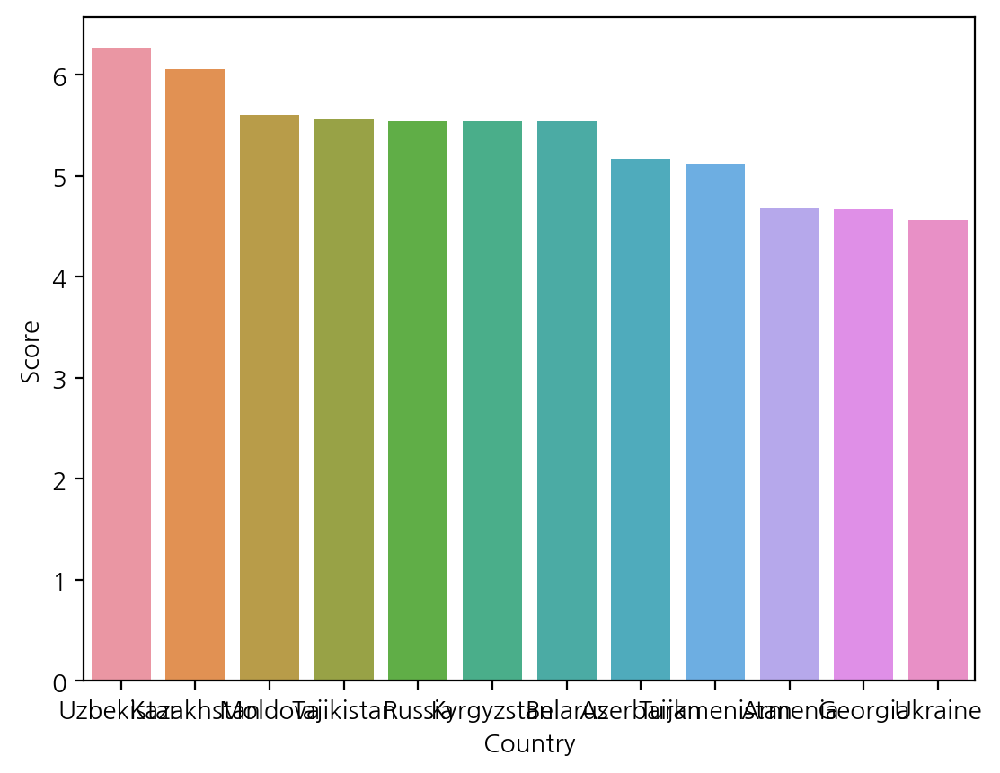

In [99]:
sns.barplot(x='Country', y='Score', data=country_score)
# plt.xticks(rotation=90) # x 축 글자 회전 각도
plt.show()

# 산점도 그래프 -> 19 20 21데이터의 산점도 그래프, 상관관계 그래프

In [100]:
data_19_score_corona = df[df['Year'] == '2019']
data_19_score_corona

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
0,2019,Finland,Western Europe,7.769,1.340,1.587,0.986,0.596,0.153,0.393,1.88,0.834,0.0
1,2019,Denmark,Western Europe,7.600,1.383,1.573,0.996,0.592,0.252,0.410,1.88,0.514,0.0
2,2019,Norway,Western Europe,7.554,1.488,1.582,1.028,0.603,0.271,0.341,1.88,0.361,0.0
3,2019,Iceland,Western Europe,7.494,1.380,1.624,1.026,0.591,0.354,0.118,1.88,0.521,0.0
4,2019,Netherlands,Western Europe,7.488,1.396,1.522,0.999,0.557,0.322,0.298,1.88,0.514,0.0
5,2019,Switzerland,Western Europe,7.480,1.452,1.526,1.052,0.572,0.263,0.343,1.88,0.392,0.0
6,2019,Sweden,Western Europe,7.343,1.387,1.487,1.009,0.574,0.267,0.373,1.88,0.366,0.0
7,2019,New Zealand,North America and ANZ,7.307,1.303,1.557,1.026,0.585,0.330,0.380,1.88,0.246,0.0
8,2019,Canada,North America and ANZ,7.278,1.365,1.505,1.039,0.584,0.285,0.308,1.88,0.312,0.0
9,2019,Austria,Western Europe,7.246,1.376,1.475,1.016,0.532,0.244,0.226,1.88,0.497,0.0


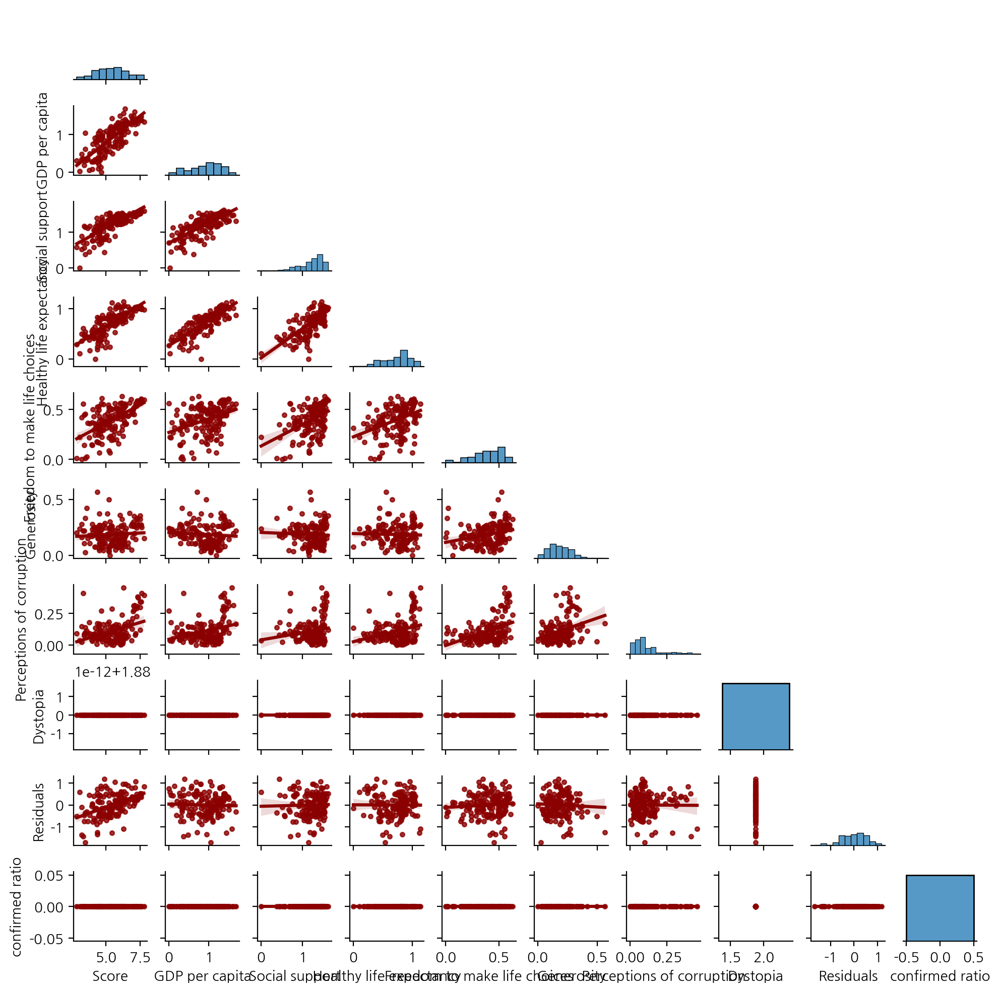

In [101]:
sns.pairplot(data_19_score_corona, kind='reg', 
             corner = True,
             plot_kws={'marker':'.','color':'darkred'}, height=1);

In [102]:
data_20_score_corona = df[df['Year'] == '2020']
data_20_score_corona

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
156,2020,Finland,Western Europe,7.809,1.285,1.500,0.961,0.662,0.160,0.478,1.97,0.791,0.0
157,2020,Denmark,Western Europe,7.646,1.327,1.503,0.979,0.665,0.243,0.495,1.97,0.460,0.0
158,2020,Switzerland,Western Europe,7.560,1.391,1.472,1.041,0.629,0.269,0.408,1.97,0.378,0.0
159,2020,Iceland,Western Europe,7.504,1.327,1.548,1.001,0.662,0.362,0.145,1.97,0.488,0.0
160,2020,Norway,Western Europe,7.488,1.424,1.495,1.008,0.670,0.288,0.434,1.97,0.196,0.0
161,2020,Netherlands,Western Europe,7.449,1.339,1.464,0.976,0.614,0.336,0.369,1.97,0.380,0.0
162,2020,Sweden,Western Europe,7.353,1.322,1.433,0.986,0.650,0.273,0.442,1.97,0.274,0.0
163,2020,New Zealand,North America and ANZ,7.300,1.242,1.487,1.008,0.647,0.326,0.461,1.97,0.156,0.0
164,2020,Austria,Western Europe,7.294,1.317,1.437,1.001,0.603,0.256,0.281,1.97,0.426,0.0
165,2020,Luxembourg,Western Europe,7.238,1.537,1.388,0.986,0.610,0.196,0.367,1.97,0.181,0.0


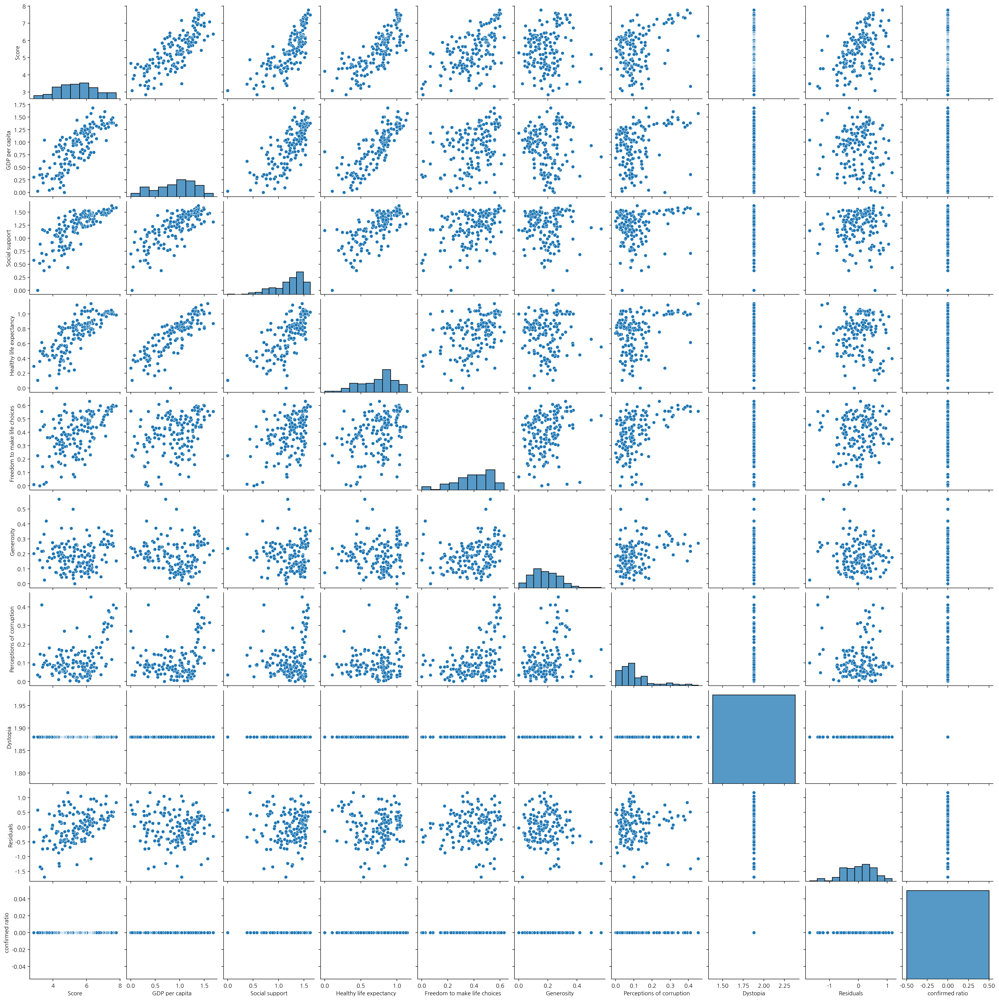

In [103]:
sns.pairplot(data_19_score_corona)

In [104]:
data_21_score_corona = df[df['Year'] == '2021']
data_21_score_corona

,Year,Country,Region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Dystopia,Residuals,confirmed ratio
309,2021,Finland,Western Europe,7.842,1.446,1.106,0.741,0.691,0.124,0.481,2.43,0.823,0.006574
310,2021,Denmark,Western Europe,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.43,0.438,0.028334
311,2021,Switzerland,Western Europe,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.43,0.409,0.052261
312,2021,Iceland,Western Europe,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.43,0.537,0.016862
313,2021,Netherlands,Western Europe,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.43,0.368,0.047655
314,2021,Norway,Western Europe,7.392,1.543,1.108,0.782,0.703,0.249,0.427,2.43,0.150,0.009143
315,2021,Sweden,Western Europe,7.363,1.478,1.062,0.763,0.685,0.244,0.448,2.43,0.253,0.043308
316,2021,Luxembourg,Western Europe,7.324,1.751,1.003,0.760,0.639,0.166,0.353,2.43,0.223,0.074148
317,2021,New Zealand,North America and ANZ,7.277,1.400,1.094,0.785,0.665,0.276,0.445,2.43,0.182,0.000448
318,2021,Austria,Western Europe,7.268,1.492,1.062,0.782,0.640,0.215,0.292,2.43,0.354,0.039534


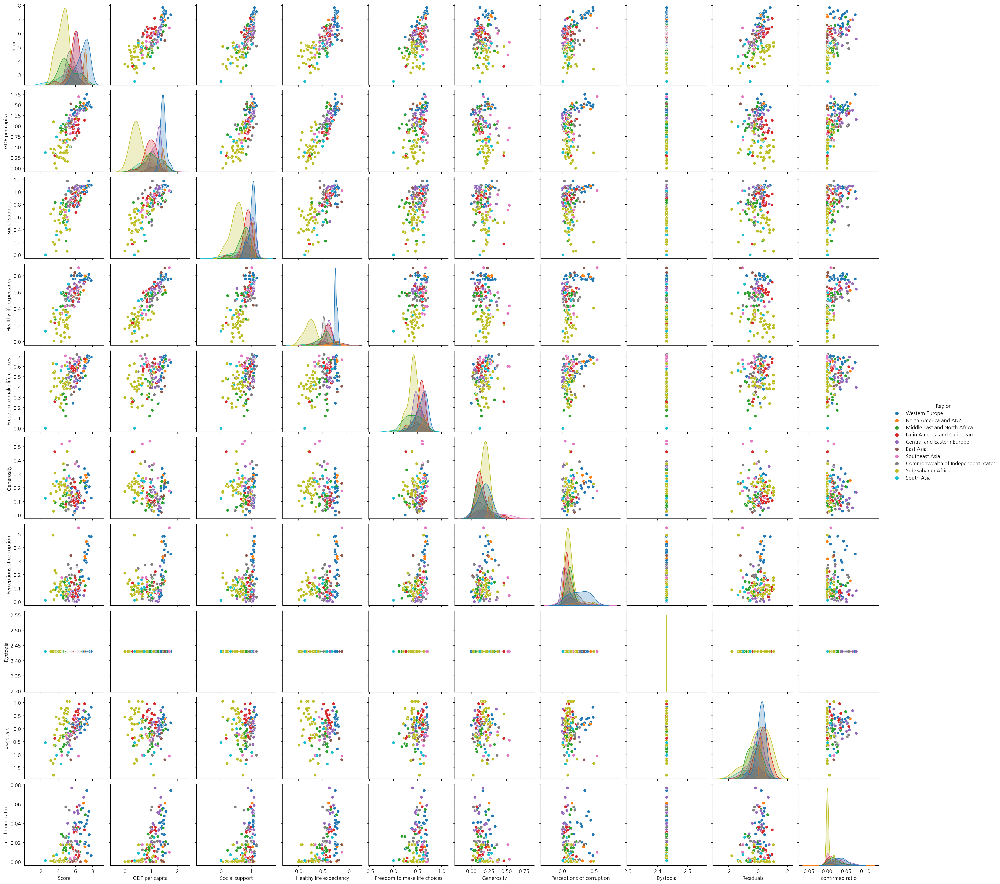

In [105]:
sns.pairplot(data_21_score_corona, hue="Region")
plt.show()

# 코로나 확진비율과 점수의 상관관계

In [106]:
fig = px.scatter(data_21_score_corona, x = 'Score', y = 'confirmed ratio',
                 color = 'Region')
fig.show()

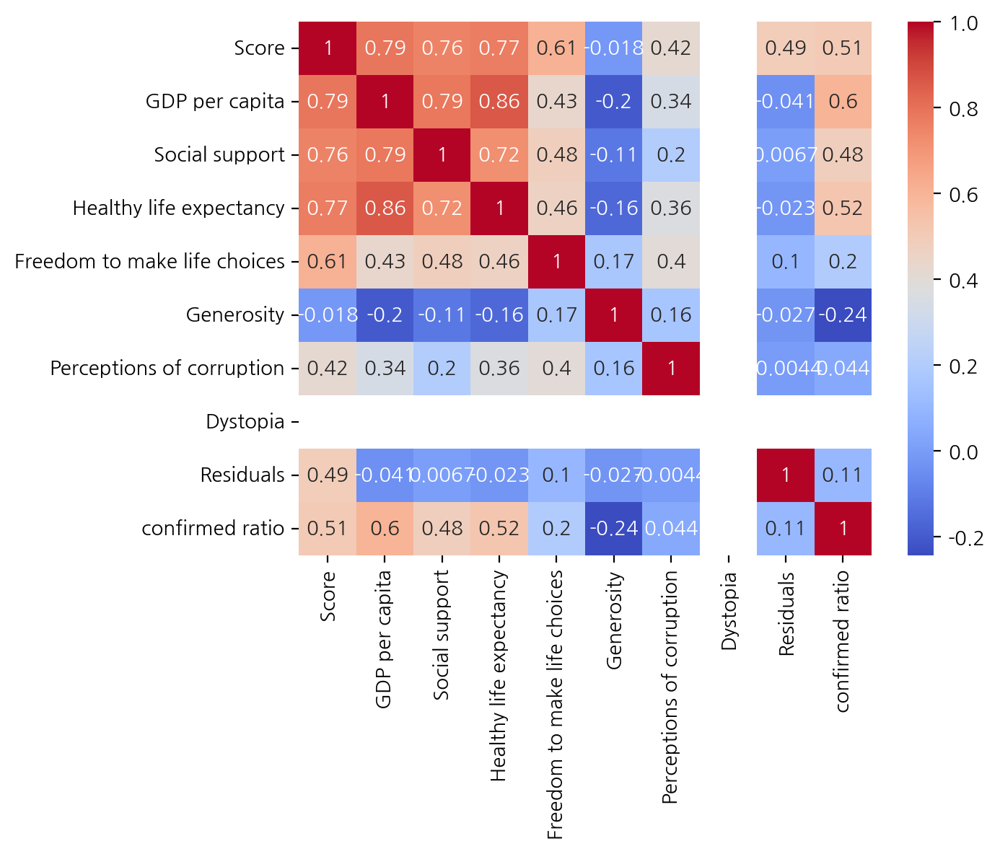

In [107]:
corr_matrix = data_21_score_corona.corr()

fig_score_confirmed = sns.heatmap(corr_matrix, cmap='coolwarm', annot = True)

In [108]:
# 포디움을 이용해서 세계지도에 21년도 행복지수와 감염비율 표현하기
# https://towardsdatascience.com/simple-yet-stunning-and-meaningful-geospatial-visualization-using-happiness-and-confict-data-e9fbf690675c